### Import packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import copy
import math

%matplotlib inline

In [6]:
from ydata_profiling import ProfileReport

### Read data

In [7]:
data = pd.read_csv("water_potability.csv", thousands=',', skipinitialspace=True)
data

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
...,...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1


### Drop empty lines in data and remove NAN's

In [8]:
data = data.dropna()
data

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0
...,...,...,...,...,...,...,...,...,...,...
3267,8.989900,215.047358,15921.412018,6.297312,312.931022,390.410231,9.899115,55.069304,4.613843,1
3268,6.702547,207.321086,17246.920347,7.708117,304.510230,329.266002,16.217303,28.878601,3.442983,1
3269,11.491011,94.812545,37188.826022,9.263166,258.930600,439.893618,16.172755,41.558501,4.369264,1
3270,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712,1


### Reset the index for potentially removed rows in data

In [9]:
data = data.reset_index(drop=True)

## EDA - Exploratory Data Analysis

### View data statistics - short format

In [10]:
data.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000
mean,7.085990,195.968072,21917.441374,7.134338,333.224672,426.526409,14.357709,66.400859,3.969729,0.403282
std,1.573337,32.635085,8642.239815,1.584820,41.205172,80.712572,3.324959,16.077109,0.780346,0.490678
min,0.227499,73.492234,320.942611,1.390871,129.000000,201.619737,2.200000,8.577013,1.450000,0.000000
25%,6.089723,176.744938,15615.665390,6.138895,307.632511,366.680307,12.124105,55.952664,3.442915,0.000000
50%,7.027297,197.191839,20933.512750,7.143907,332.232177,423.455906,14.322019,66.542198,3.968177,0.000000
75%,8.052969,216.441070,27182.587067,8.109726,359.330555,482.373169,16.683049,77.291925,4.514175,1.000000
max,14.000000,317.338124,56488.672413,13.127000,481.030642,753.342620,27.006707,124.000000,6.494749,1.000000


### View data statistics - long format

In [11]:
profile = ProfileReport(data, title="Water potability")

In [12]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 135.35it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Create x and y from original data

In [13]:
x_data = data.drop(columns=['Potability'])
x_data

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
0,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771
1,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075
2,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708
3,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989
4,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425
...,...,...,...,...,...,...,...,...,...
2006,8.989900,215.047358,15921.412018,6.297312,312.931022,390.410231,9.899115,55.069304,4.613843
2007,6.702547,207.321086,17246.920347,7.708117,304.510230,329.266002,16.217303,28.878601,3.442983
2008,11.491011,94.812545,37188.826022,9.263166,258.930600,439.893618,16.172755,41.558501,4.369264
2009,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712


In [14]:
y_data = data[['Potability']]
y_data

,Potability
0,0
1,0
2,0
3,0
4,0
...,...
2006,1
2007,1
2008,1
2009,1


### View features against Potability

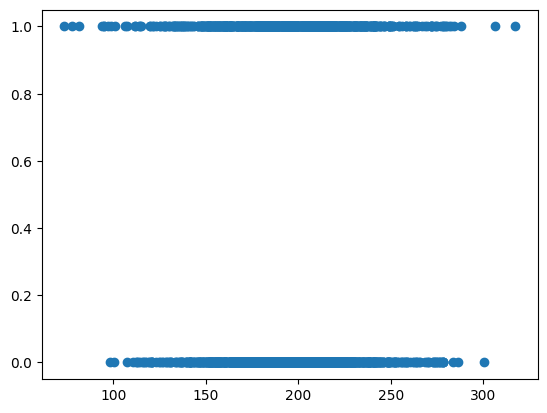

In [15]:
plt.scatter(x_data['Hardness'], y_data)

### Split data into training and validation datasets: Default 80% train, 20% validation

In [16]:
x_train, x_validation, y_train, y_validation = train_test_split(x_data, y_data, test_size=0.2, random_state=42, stratify=y_data)

In [17]:
x_train = x_train.to_numpy()
x_validation = x_validation.to_numpy()
y_train = y_train.to_numpy()
y_validation = y_validation.to_numpy()

In [18]:
x_train[0]

array([9.05862842e+00, 1.55357557e+02, 1.57374689e+04, 7.25197886e+00,
       3.43233977e+02, 4.63389256e+02, 1.78544700e+01, 8.31751893e+01,
       3.65213447e+00])

### Visualize the nuber of training samples and number of validation samples

In [19]:
len(y_train), len(y_validation)

(1608, 403)

In [20]:
np.unique(y_train, return_counts=True)

(array([0, 1]), array([960, 648]))

In [21]:
np.unique(y_validation, return_counts=True)

(array([0, 1]), array([240, 163]))

### Standardization - mean and standard deviation calculation

In [22]:
mean   = np.mean(x_train, axis=0)
sigma  = np.std(x_train, axis=0)

In [23]:
x_train = (x_train - mean) / sigma

In [24]:
x_validation = (x_validation - mean) / sigma

In [267]:
# water potability dataset has features with very different scales:

#pH: ~0-14 (small range)
#Solids: ~300-61,000 (very large range)
#Conductivity: ~180-750 (medium range)

# pH:          [0,   2,   4,   6,   8,  10,  12,  14]
# Solids:      [320, 5000, 10000, 15000, 25000, 45000, 61000]
# Conductivity:[181, 300,  400,   500,   600,   700,   753]

# after standardization:

# pH:          [-2.1, -1.2, -0.3,  0.6,  1.5,  2.4,  3.3,  4.2]
# Solids:      [-2.0, -1.1, -0.2,  0.7,  1.6,  2.5,  3.4]
# Conductivity:[-1.9, -1.0, -0.1,  0.8,  1.7,  2.6,  3.5]


### View min and max values after standardization from training dataset

In [25]:
x_train.min(), x_train.max()

(np.float64(-4.926156732841158), np.float64(4.343287028023671))

### View min and max values after standardization from training dataset

In [26]:
x_validation.min(), x_validation.max()

(np.float64(-3.514089137234117), np.float64(3.9347936961944563))

### Logistic Regression implementation

In [27]:
def sigmoid(x):
    g = 1 / (1 + np.exp(-x))
    return g

In [28]:
def compute_cost(X, y, w, b, lambda_=1):
    m = X.shape[0]
    cost = 0.0
    for i in range(m):
        z_i = np.dot(X[i],w) + b
        f_wb_i = sigmoid(z_i)
        cost +=  -y[i] * np.log(f_wb_i) - (1 - y[i]) * np.log(1 - f_wb_i) 
             
    cost = cost / m
    return cost

In [29]:
def compute_gradient(X, y, w, b, lambda_=1):
    m,n = X.shape
    dj_dw = np.zeros((n,))                           #(n,)
    dj_db = 0.

    for i in range(m):
        f_wb_i = sigmoid(np.dot(X[i], w) + b)          #(n,)(n,)=scalar
        err_i  = f_wb_i  - y[i]                       #scalar
        for j in range(n):
            dj_dw[j] += err_i * X[i,j]      #scalar
        dj_db += err_i
    dj_dw = dj_dw/m                                   #(n,)
    dj_db = dj_db/m                                   #scalar
        
    return dj_db, dj_dw

In [30]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):    
    # number of training examples
    m = len(x_train)
    
    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)
    
    for i in range(num_iters):
        
        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)   

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw               
        b_in = b_in - alpha * dj_db              
        
        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_train_b.npy', b_in) 


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_valid_b.npy', b_in) 
        
        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")
        
    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [62]:
initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 100
alpha = 1
lambda_ = 0
if not os.path.exists('model'):
    os.makedirs('model')
w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost, gradient_function=compute_gradient, alpha=alpha, num_iters=iterations, lambda_=lambda_)

C:\Users\roxan\AppData\Local\Temp\ipykernel_13944\2253367060.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  dj_dw[j] += err_i * X[i,j]      #scalar


Iteration    0: Cost Train: 0.683969 	  Cost Validation: 0.685303
Iteration   10: Cost Train: 0.672048 	  Cost Validation: 0.677415
Iteration   20: Cost Train: 0.671998 	  Cost Validation: 0.677660
Iteration   30: Cost Train: 0.671998 	  Cost Validation: 0.677682
Iteration   40: Cost Train: 0.671998 	  Cost Validation: 0.677684
Iteration   50: Cost Train: 0.671998 	  Cost Validation: 0.677684
Iteration   60: Cost Train: 0.671998 	  Cost Validation: 0.677684
Iteration   70: Cost Train: 0.671998 	  Cost Validation: 0.677684
Iteration   80: Cost Train: 0.671998 	  Cost Validation: 0.677684
Iteration   90: Cost Train: 0.671998 	  Cost Validation: 0.677684
Iteration   99: Cost Train: 0.671998 	  Cost Validation: 0.677684


In [63]:
best_w_final = np.load('model/best_valid_w_in.npy')
best_b_final = np.load('model/best_valid_b.npy')

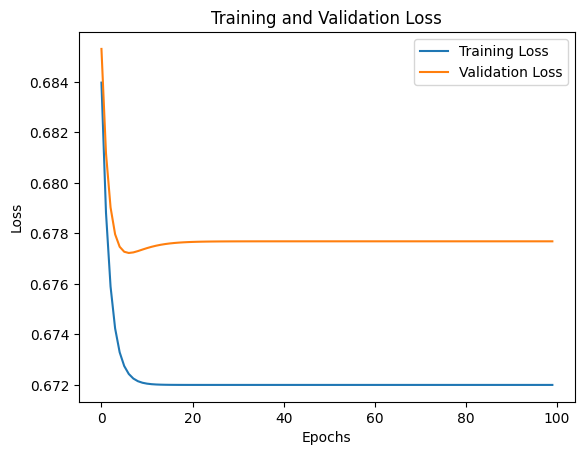

In [64]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)
 
# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))
 
# Display the plot
plt.legend(loc='best')
plt.show()

In [268]:
# Fast, stable convergence - both curves plateau within 20 iterations with no overfitting

In [65]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape   
    p = np.zeros(m)
    
    for i in range(m):   
        z_wb = 0
        # Loop over each feature
        for j in range(n): 
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]
        
        # Add bias term 
        z_wb += b
        
        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5
        
    return p

In [66]:
y_predicted = predict(x_train, w_final, b_final)

C:\Users\roxan\AppData\Local\Temp\ipykernel_13944\7029633.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.5


In [67]:
y_train.shape

(1608, 1)

In [68]:
y_train.reshape(-1).shape, y_predicted.shape

((1608,), (1608,))

In [69]:
(y_train.reshape(-1) == y_predicted).sum()

np.int64(964)

In [70]:
x_train.shape
x_train.shape

(1608, 9)

In [71]:
y_train = y_train.reshape(-1)

In [72]:
type(y_predicted)

numpy.ndarray

In [73]:
def metrics_computations(x:np.array,
                         y_true:np.array,
                         y_predicted: np.array):
    total_number_of_samples = x.shape[0]
    accuracy = (y_true == y_predicted).sum() / total_number_of_samples
    true_positive = ((y_predicted == 1) & (y_true == 1)).sum()
    false_positive = ((y_predicted == 1) & (y_true == 0)).sum()
    false_negative = ((y_predicted == 0) & (y_true == 1)).sum()
    true_negative = ((y_predicted == 0) & (y_true == 0)).sum()
    
    precision = true_positive / (true_positive + false_positive)
    recall = true_positive / (true_positive + false_negative)
    specificity = true_negative / (true_negative + false_positive)
    f1_score = (2 * precision * recall) / (precision + recall)
    
    false_negative_rate = false_negative / (false_negative + true_positive)
    false_positive_rate = false_positive / (false_positive + true_negative)

    return (accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate)

In [74]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

In [75]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 59.95% 
 Precision: 83.33% 
 Recall: 0.77% 
 F1 Score: 1.53% 
 Specificity: 99.90% 
 False Positive Rate: 0.10% 
 False Negative Rate: 99.23%


In [269]:
# :( nu stiu de ce e asa prost :(

In [270]:
y_predicted_validation = predict(x_validation, w_final, b_final)

C:\Users\roxan\AppData\Local\Temp\ipykernel_13944\7029633.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.5


In [271]:
y_validation = y_validation.reshape(-1)

In [272]:
for i, j in zip(y_validation, y_predicted_validation):
    print(i, j)

0 1.0
0 1.0
0 1.0
0 1.0
0 1.0
0 1.0
0 1.0
0 1.0
1 1.0
0 1.0
0 1.0
0 1.0
1 1.0
1 1.0
1 1.0
0 1.0
1 1.0
0 1.0
1 1.0
0 1.0
0 1.0
1 1.0
0 1.0
0 1.0
1 1.0
1 1.0
0 1.0
0 1.0
0 1.0
0 1.0
1 1.0
0 1.0
0 1.0
0 1.0
1 1.0
0 1.0
0 1.0
0 1.0
0 1.0
0 1.0
0 1.0
1 1.0
1 1.0
0 1.0
0 1.0
1 1.0
1 1.0
1 1.0
0 1.0
1 1.0
0 1.0
0 1.0
0 1.0
0 1.0
1 1.0
1 1.0
1 1.0
0 1.0
1 1.0
1 1.0
1 1.0
1 1.0
0 1.0
1 1.0
0 1.0
0 1.0
0 1.0
1 1.0
0 1.0
0 1.0
1 1.0
1 1.0
1 1.0
1 1.0
0 1.0
1 1.0
1 1.0
0 1.0
0 1.0
0 1.0
1 1.0
1 1.0
1 1.0
0 1.0
1 1.0
0 1.0
0 1.0
0 1.0
0 1.0
0 1.0
1 1.0
0 1.0
0 1.0
0 1.0
1 1.0
1 1.0
0 1.0
0 1.0
1 1.0
1 1.0
0 1.0
0 1.0
0 1.0
1 1.0
0 1.0
1 1.0
0 1.0
0 1.0
1 1.0
0 1.0
0 1.0
0 1.0
0 1.0
0 1.0
1 1.0
0 1.0
1 1.0
0 1.0
1 1.0
0 1.0
0 1.0
1 1.0
0 1.0
0 1.0
0 1.0
0 1.0
1 1.0
1 1.0
1 1.0
0 1.0
1 1.0
1 1.0
1 1.0
1 1.0
0 1.0
0 1.0
1 1.0
0 1.0
0 1.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
0 1.0
1 1.0
0 1.0
1 1.0
0 1.0
1 1.0
1 1.0
0 1.0
1 1.0
1 1.0
0 1.0
0 1.0
1 1.0
0 1.0
0 1.0
1 1.0
0 1.0
1 1.0
0 1.0
0 1.0
0 1.0
1 1.0
0 1.

In [273]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [274]:
print(f"[Valid] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[Valid] Accuracy: 40.45% 
 Precision: 40.45% 
 Recall: 100.00% 
 F1 Score: 57.60% 
 Specificity: 0.00% 
 False Positive Rate: 100.00% 
 False Negative Rate: 0.00%


In [275]:
# model says ALL water is potable :( worse than random guessing

### Analyze the feature importance

<Axes: ylabel='Feature'>

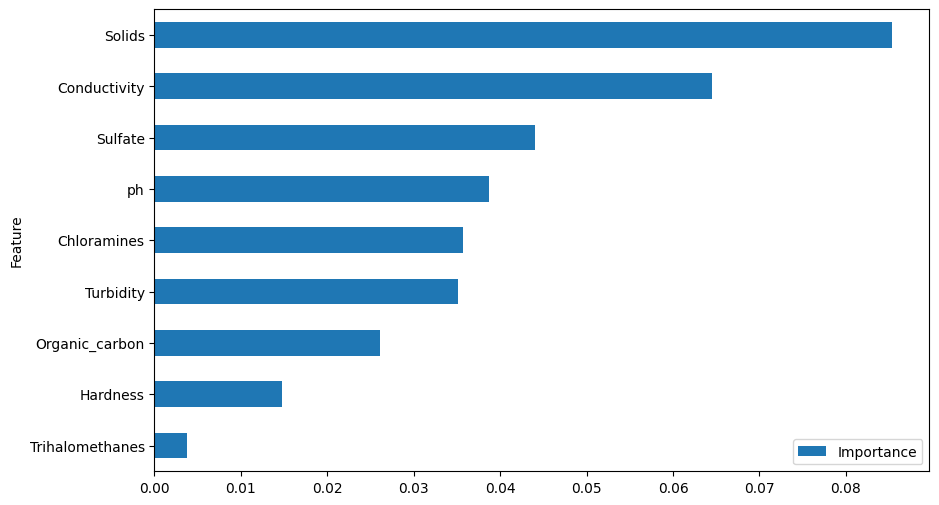

In [81]:
coefficients = copy.deepcopy(w_final)

feature_importance = pd.DataFrame({'Feature': x_data.columns.values, 'Importance': np.abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

In [276]:
# most important feature is the quantity of solids found in water
# lest important : trihalomethanes (?)

### Add polynomial features for improving model capacity

In [277]:
#pip install scikit-learn
from sklearn import preprocessing

In [278]:
poly = preprocessing.PolynomialFeatures(2, interaction_only=False, include_bias=False)

In [279]:
poly_values = poly.fit_transform(x_data)
poly_values

array([[8.31676588e+00, 2.14373394e+02, 2.20184174e+04, ...,
        1.00684516e+04, 4.64458586e+02, 2.14255167e+01],
       [9.09222346e+00, 1.81101509e+02, 1.79789863e+04, ...,
        1.02387154e+03, 1.30394234e+02, 1.66062397e+01],
       [5.58408664e+00, 1.88313324e+02, 2.87486877e+04, ...,
        3.01597155e+03, 1.40573703e+02, 6.55210621e+00],
       ...,
       [1.14910109e+01, 9.48125452e+01, 3.71888260e+04, ...,
        1.72710898e+03, 1.81580074e+02, 1.90904706e+01],
       [6.06961576e+00, 1.86659040e+02, 2.61387802e+04, ...,
        3.65056686e+03, 2.21723692e+02, 1.34667840e+01],
       [4.66810169e+00, 1.93681735e+02, 4.75809916e+04, ...,
        4.44724864e+03, 2.95814671e+02, 1.96765071e+01]])

In [280]:
poly_column_names = list(poly.get_feature_names_out(x_data.columns))
poly_column_names

['ph',
 'Hardness',
 'Solids',
 'Chloramines',
 'Sulfate',
 'Conductivity',
 'Organic_carbon',
 'Trihalomethanes',
 'Turbidity',
 'ph^2',
 'ph Hardness',
 'ph Solids',
 'ph Chloramines',
 'ph Sulfate',
 'ph Conductivity',
 'ph Organic_carbon',
 'ph Trihalomethanes',
 'ph Turbidity',
 'Hardness^2',
 'Hardness Solids',
 'Hardness Chloramines',
 'Hardness Sulfate',
 'Hardness Conductivity',
 'Hardness Organic_carbon',
 'Hardness Trihalomethanes',
 'Hardness Turbidity',
 'Solids^2',
 'Solids Chloramines',
 'Solids Sulfate',
 'Solids Conductivity',
 'Solids Organic_carbon',
 'Solids Trihalomethanes',
 'Solids Turbidity',
 'Chloramines^2',
 'Chloramines Sulfate',
 'Chloramines Conductivity',
 'Chloramines Organic_carbon',
 'Chloramines Trihalomethanes',
 'Chloramines Turbidity',
 'Sulfate^2',
 'Sulfate Conductivity',
 'Sulfate Organic_carbon',
 'Sulfate Trihalomethanes',
 'Sulfate Turbidity',
 'Conductivity^2',
 'Conductivity Organic_carbon',
 'Conductivity Trihalomethanes',
 'Conductivity T

In [281]:
x_data = pd.DataFrame(poly_values, columns=poly_column_names)
x_data

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,ph^2,...,Conductivity^2,Conductivity Organic_carbon,Conductivity Trihalomethanes,Conductivity Turbidity,Organic_carbon^2,Organic_carbon Trihalomethanes,Organic_carbon Turbidity,Trihalomethanes^2,Trihalomethanes Turbidity,Turbidity^2
0,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,69.168595,...,131962.561766,6697.372024,36450.770473,1681.477347,339.905435,1849.951737,85.338441,10068.451614,464.458586,21.425517
1,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,82.668527,...,158731.176220,4604.943514,12748.346309,1623.554115,133.593824,369.841742,47.100861,1023.871539,130.394234,16.606240
2,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,31.182024,...,78662.251868,2355.856069,15402.698258,717.916032,70.555542,461.295466,21.500870,3015.971549,140.573703,6.552106
3,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,104.527358,...,80458.249192,3911.469602,23997.936909,758.197622,190.155697,1166.657262,36.859700,7157.761717,226.144353,7.144869
4,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,74.577883,...,225252.416638,5867.961926,29804.557523,2088.949819,152.863963,776.426781,54.418408,3943.627609,276.402029,19.372540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2006,8.989900,215.047358,15921.412018,6.297312,312.931022,390.410231,9.899115,55.069304,4.613843,80.818304,...,152420.148183,3864.715923,21499.619647,1801.291450,97.992486,545.137394,45.672963,3032.628235,254.081114,21.287546
2007,6.702547,207.321086,17246.920347,7.708117,304.510230,329.266002,16.217303,28.878601,3.442983,44.924130,...,108416.099915,5339.806501,9508.741600,1133.657258,263.000915,468.333027,55.835899,833.973615,99.428534,11.854132
2008,11.491011,94.812545,37188.826022,9.263166,258.930600,439.893618,16.172755,41.558501,4.369264,132.043332,...,193506.395084,7114.291904,18281.319236,1922.011487,261.558019,672.115469,70.663043,1727.108982,181.580074,19.090471
2009,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712,36.840235,...,172961.958937,5018.765549,25127.856972,1526.185224,145.627442,729.124622,44.284685,3650.566864,221.723692,13.466784


In [282]:
x_data.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'ph^2', 'ph Hardness',
       'ph Solids', 'ph Chloramines', 'ph Sulfate', 'ph Conductivity',
       'ph Organic_carbon', 'ph Trihalomethanes', 'ph Turbidity', 'Hardness^2',
       'Hardness Solids', 'Hardness Chloramines', 'Hardness Sulfate',
       'Hardness Conductivity', 'Hardness Organic_carbon',
       'Hardness Trihalomethanes', 'Hardness Turbidity', 'Solids^2',
       'Solids Chloramines', 'Solids Sulfate', 'Solids Conductivity',
       'Solids Organic_carbon', 'Solids Trihalomethanes', 'Solids Turbidity',
       'Chloramines^2', 'Chloramines Sulfate', 'Chloramines Conductivity',
       'Chloramines Organic_carbon', 'Chloramines Trihalomethanes',
       'Chloramines Turbidity', 'Sulfate^2', 'Sulfate Conductivity',
       'Sulfate Organic_carbon', 'Sulfate Trihalomethanes',
       'Sulfate Turbidity', 'Conductivity^2', 'Conductivity Organic_carbon

### Split data into training and validation datasets: Default 80% train, 20% validation

In [283]:
x_train, x_validation, y_train, y_validation = train_test_split(x_data, y_data, test_size=0.2, random_state=42, stratify=y_data)

In [284]:
x_train = x_train.to_numpy()
x_validation = x_validation.to_numpy()
y_train = y_train.to_numpy()
y_validation = y_validation.to_numpy()

### Visualize how one sample looks like

In [285]:
x_train[0]

array([9.05862842e+00, 1.55357557e+02, 1.57374689e+04, 7.25197886e+00,
       3.43233977e+02, 4.63389256e+02, 1.78544700e+01, 8.31751893e+01,
       3.65213447e+00, 8.20587489e+01, 1.40732638e+03, 1.42559883e+05,
       6.56929818e+01, 3.10922906e+03, 4.19767109e+03, 1.61737010e+02,
       7.53453134e+02, 3.30833291e+01, 2.41359706e+04, 2.44493473e+06,
       1.12664972e+03, 5.33239922e+04, 7.19910228e+04, 2.77382685e+03,
       1.29218942e+04, 5.67386690e+02, 2.47667929e+08, 1.14127792e+05,
       5.40163405e+06, 7.29257402e+06, 2.80984167e+05, 1.30896696e+06,
       5.74753528e+04, 5.25911973e+01, 2.48912554e+03, 3.36048909e+03,
       1.29480239e+02, 6.03184714e+02, 2.64852020e+01, 1.17809563e+05,
       1.59050937e+05, 6.12826075e+03, 2.85485510e+04, 1.25353664e+03,
       2.14729603e+05, 8.27356958e+03, 3.85424891e+04, 1.69235987e+03,
       3.18782100e+02, 1.48504892e+03, 6.52069254e+01, 6.91811212e+03,
       3.03766976e+02, 1.33380862e+01])

### Visualize the nuber of training samples and number of validation samples

In [286]:
len(y_train), len(y_validation)

(1608, 403)

In [287]:
np.unique(y_train, return_counts=True)

(array([0, 1]), array([960, 648]))

In [288]:
np.unique(y_validation, return_counts=True)

(array([0, 1]), array([240, 163]))

### Standardization - mean and standard deviation calculation

In [289]:
mean   = np.mean(x_train, axis=0)
sigma  = np.std(x_train, axis=0)

In [290]:
x_train = (x_train - mean) / sigma

### Standardizing using mean and standard deviation calculated from the training dataset

In [291]:
x_validation = (x_validation - mean) / sigma

### View min and max values after standardization from training dataset

In [292]:
x_train.min(), x_train.max()

(np.float64(-4.92615673284116), np.float64(6.256831107385165))

### View min and max values after standardization from training dataset

In [293]:
x_validation.min(), x_validation.max()

(np.float64(-3.5140891372341185), np.float64(5.688066370209021))

### Train with polynomial features

In [294]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):    
    # number of training examples
    m = len(x_train)
    
    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)
    
    for i in range(num_iters):
        
        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)   

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw               
        b_in = b_in - alpha * dj_db              
        
        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_poly_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_poly_train_b.npy', b_in) 


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_poly_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_poly_valid_b.npy', b_in) 
        
        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")
        
    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [295]:
initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 100
alpha = 0.8
lambda_ = 0
if not os.path.exists('model'):
    os.makedirs('model')
w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost, gradient_function=compute_gradient, alpha=alpha, num_iters=iterations, lambda_=lambda_)

C:\Users\roxan\AppData\Local\Temp\ipykernel_13944\2253367060.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  dj_dw[j] += err_i * X[i,j]      #scalar


Iteration    0: Cost Train: 0.683842 	  Cost Validation: 0.688331
Iteration   10: Cost Train: 0.663736 	  Cost Validation: 0.670871
Iteration   20: Cost Train: 0.657080 	  Cost Validation: 0.665411
Iteration   30: Cost Train: 0.651424 	  Cost Validation: 0.660684
Iteration   40: Cost Train: 0.646457 	  Cost Validation: 0.656522
Iteration   50: Cost Train: 0.642059 	  Cost Validation: 0.652842
Iteration   60: Cost Train: 0.638137 	  Cost Validation: 0.649570
Iteration   70: Cost Train: 0.634618 	  Cost Validation: 0.646642
Iteration   80: Cost Train: 0.631444 	  Cost Validation: 0.644009
Iteration   90: Cost Train: 0.628566 	  Cost Validation: 0.641628
Iteration   99: Cost Train: 0.626197 	  Cost Validation: 0.639674


In [296]:
best_poly_w_final = np.load('model/best_poly_valid_w_in.npy')
best_poly_b_final = np.load('model/best_poly_valid_b.npy')

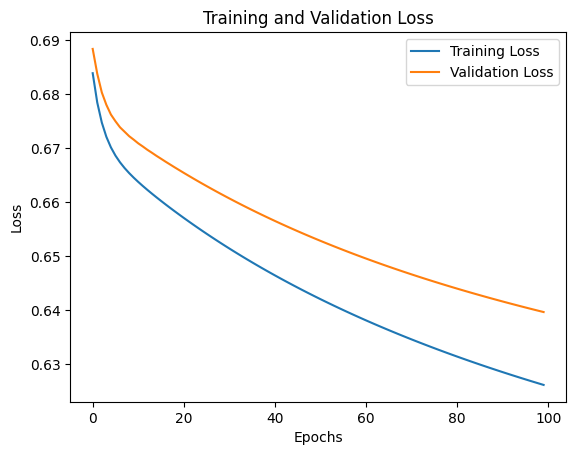

In [297]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)
 
# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))
 
# Display the plot
plt.legend(loc='best')
plt.show()

In [302]:
# Both losses steadily decrease throughout 100 epochs (no early plateau)
# Validation loss decreases smoothly, no divergence

In [303]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape   
    p = np.zeros(m)
    
    for i in range(m):   
        z_wb = 0
        # Loop over each feature
        for j in range(n): 
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]
        
        # Add bias term 
        z_wb += b
        
        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5
        
    return p

In [304]:
y_predicted = predict(x_train, w_final, b_final)

C:\Users\roxan\AppData\Local\Temp\ipykernel_13944\7029633.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.5


In [305]:
y_train.shape

(1608, 1)

In [306]:
y_train.reshape(-1).shape, y_predicted.shape

((1608,), (1608,))

In [307]:
(y_train.reshape(-1) == y_predicted).sum()

np.int64(1057)

In [308]:
y_train = y_train.reshape(-1)

In [309]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

In [310]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 65.73% 
 Precision: 83.92% 
 Recall: 18.52% 
 F1 Score: 30.34% 
 Specificity: 97.60% 
 False Positive Rate: 2.40% 
 False Negative Rate: 81.48%


In [311]:
# Much better balance, but still conservative
# Good precision (83.92%) - When it says "potable," it's usually right
# Reasonable specificity (97.60%) - Good at identifying non-potable water
# Low recall (18.52%) - Still missing 81% of potable water samples
# High false negative rate (81.48%) - Too many safe waters labeled unsafe

In [312]:
y_predicted_validation = predict(x_validation, w_final, b_final)

C:\Users\roxan\AppData\Local\Temp\ipykernel_13944\7029633.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.5


In [313]:
y_validation = y_validation.reshape(-1)

In [314]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [315]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 63.52% 
 Precision: 83.33% 
 Recall: 12.27% 
 F1 Score: 21.39% 
 Specificity: 98.33% 
 False Positive Rate: 1.67% 
 False Negative Rate: 87.73%


In [316]:
# Stable generalization - Similar to training (63.52% vs 65.73%)
# High precision (83.33%) - Reliable positive predictions
# Very low false positives (1.67%) 
# Extremely low recall (12.27%) - Missing ~88% of potable water

### Analyze the feature importance

<Axes: ylabel='Feature'>

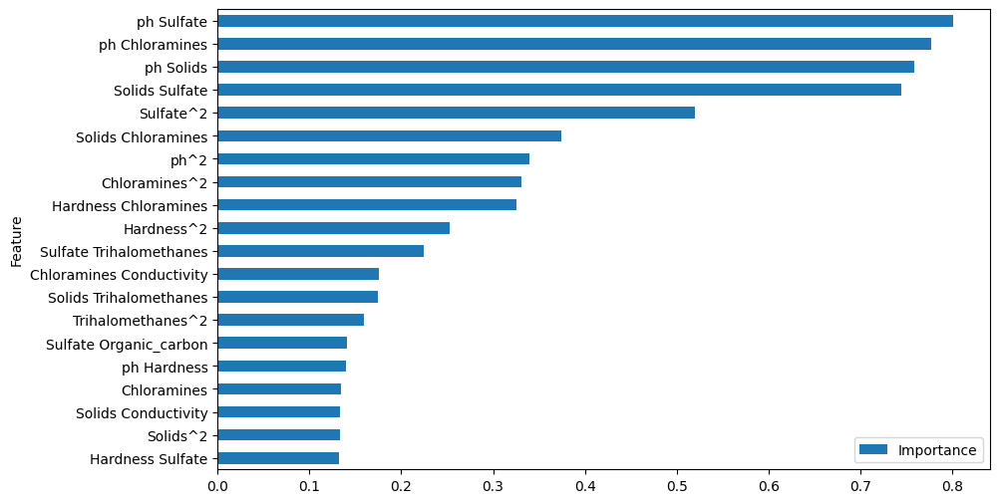

In [317]:
coefficients = copy.deepcopy(w_final)

feature_importance = pd.DataFrame({'Feature': x_data.columns.values, 'Importance': np.abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.tail(20).plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

In [318]:
# pH × Sulfate - Most important interaction (water acidity + mineral content)
# pH dominates - Appears in top 4 most important features
# Interaction effects are more important than individual features

### Decision Tree 

In [319]:
x_data = data.drop(columns=['Potability'])

### Split data into training and validation datasets: Default 80% train, 20% validation

In [320]:
x_train, x_validation, y_train, y_validation = train_test_split(x_data, y_data, test_size=0.2, random_state=42, stratify=y_data)

In [321]:
x_train = x_train.to_numpy()
x_validation = x_validation.to_numpy()
y_train = y_train.to_numpy()
y_validation = y_validation.to_numpy()

### Visualize how one sample looks like

In [322]:
x_train[0]

array([9.05862842e+00, 1.55357557e+02, 1.57374689e+04, 7.25197886e+00,
       3.43233977e+02, 4.63389256e+02, 1.78544700e+01, 8.31751893e+01,
       3.65213447e+00])

### Visualize the nuber of training samples and number of validation samples

In [323]:
len(y_train), len(y_validation)

(1608, 403)

### Visualize the number of no churn vs churn samples in training dataset

In [324]:
np.unique(y_train, return_counts=True)

(array([0, 1]), array([960, 648]))

In [325]:
np.unique(y_validation, return_counts=True)

(array([0, 1]), array([240, 163]))

In [326]:
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.metrics import accuracy_score

### Decision Tree Code and Implementation

#### Declare Decision Tree with corresponding Hyperparameters

In [348]:
classifier = DecisionTreeClassifier(criterion='entropy', min_samples_split=2, max_depth=4)

In [349]:
type(x_train)

numpy.ndarray

#### Train the Decision Tree

In [350]:
classifier.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=4)

#### Predict on the training dataset 

In [351]:
y_predicted = classifier.predict(x_train)
y_predicted = np.array(y_predicted)

### Display training metrics

In [352]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train.reshape(-1),
                                                                                                                     y_predicted=y_predicted)

In [353]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 66.29% 
 Precision: 68.03% 
 Recall: 30.86% 
 F1 Score: 42.46% 
 Specificity: 90.21% 
 False Positive Rate: 9.79% 
 False Negative Rate: 69.14%


In [361]:
# Good accuracy - 66.29% accuracy shows good learning
# Balanced precision/recall - 68% precision, 31% recall (not extreme)
# Strong safety profile - 90% specificity (catches unsafe water well)
# Moderate F1 (42.46%) - Reasonable balance for imbalanced dataset

### Display validation metrics

In [355]:
y_predicted_valid = classifier.predict(x_validation)
y_predicted_valid = np.array(y_predicted_valid)

In [356]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation.reshape(-1),
                                                                                                                     y_predicted=y_predicted_valid)

In [357]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 63.28% 
 Precision: 59.74% 
 Recall: 28.22% 
 F1 Score: 38.33% 
 Specificity: 87.08% 
 False Positive Rate: 12.92% 
 False Negative Rate: 71.78%


In [362]:
# Godd performance - 63.28% accuracy
# Conservative predictions - 60% precision (reliable when says "potable")
# Low recall - Only 28% recall (misses 72% of safe water)
# High safety margin - 87% specificity

### Display Decision Tree and Learned rules by the Tree 

In [358]:
from sklearn.tree import plot_tree

fig, axes = plt.subplots(nrows = 1,ncols = 1, figsize=(70,50), dpi=300)
plot_tree(classifier, filled=True, fontsize=20, feature_names=list(x_data.columns),rounded=True, ax=axes)
plt.savefig('decisionTree.png')

In [359]:
from sklearn.tree import _tree
text_representation = export_text(classifier, feature_names=list(x_data.columns), class_names=['Not Potable', 'Potable'])
print(text_representation)

|--- Sulfate <= 261.02
|   |--- Solids <= 21075.41
|   |   |--- ph <= 7.95
|   |   |   |--- Trihalomethanes <= 17.84
|   |   |   |   |--- class: Potable
|   |   |   |--- Trihalomethanes >  17.84
|   |   |   |   |--- class: Not Potable
|   |   |--- ph >  7.95
|   |   |   |--- class: Potable
|   |--- Solids >  21075.41
|   |   |--- ph <= 5.83
|   |   |   |--- Conductivity <= 454.64
|   |   |   |   |--- class: Potable
|   |   |   |--- Conductivity >  454.64
|   |   |   |   |--- class: Not Potable
|   |   |--- ph >  5.83
|   |   |   |--- ph <= 11.53
|   |   |   |   |--- class: Potable
|   |   |   |--- ph >  11.53
|   |   |   |   |--- class: Not Potable
|--- Sulfate >  261.02
|   |--- Sulfate <= 387.27
|   |   |--- ph <= 5.61
|   |   |   |--- Sulfate <= 340.48
|   |   |   |   |--- class: Not Potable
|   |   |   |--- Sulfate >  340.48
|   |   |   |   |--- class: Not Potable
|   |   |--- ph >  5.61
|   |   |   |--- Sulfate <= 295.03
|   |   |   |   |--- class: Potable
|   |   |   |--- Sulfate

In [360]:
def get_rules(tree, feature_names, class_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]

    paths = []
    path = []
    
    def recurse(node, path, paths):
        
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 3)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 3)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]
            
    recurse(0, path, paths)

    # sort by samples count
    samples_count = [p[-1][1] for p in paths]
    ii = list(np.argsort(samples_count))
    paths = [paths[i] for i in reversed(ii)]
    
    rules = []
    for path in paths:
        rule = "if "
        
        for p in path[:-1]:
            if rule != "if ":
                rule += " and "
            rule += str(p)
        rule += " then "
        if class_names is None:
            rule += "response: "+str(np.round(path[-1][0][0][0],3))
        else:
            classes = path[-1][0][0]
            l = np.argmax(classes)
            rule += f"class: {class_names[l]} (proba: {np.round(100.0*classes[l]/np.sum(classes),2)}%)"
        rule += f" | based on {path[-1][1]:,} samples"
        rules += [rule]
        
    return rules

In [266]:
rules = get_rules(classifier, feature_names=list(x_data.columns), class_names=['Not potable', 'Potable'])
for r in rules:
    print(r)

if (Sulfate > 261.019) and (Sulfate <= 387.266) and (ph > 5.609) and (Sulfate > 295.03) and (Chloramines <= 11.301) then class: Not potable (proba: 62.85%) | based on 1,012 samples
if (Sulfate > 261.019) and (Sulfate <= 387.266) and (ph <= 5.609) and (Sulfate <= 340.478) and (Solids > 17031.193) then class: Not potable (proba: 92.11%) | based on 114 samples
if (Sulfate > 261.019) and (Sulfate <= 387.266) and (ph > 5.609) and (Sulfate <= 295.03) and (ph <= 7.313) then class: Not potable (proba: 61.63%) | based on 86 samples
if (Sulfate > 261.019) and (Sulfate <= 387.266) and (ph > 5.609) and (Sulfate <= 295.03) and (ph > 7.313) then class: Potable (proba: 72.86%) | based on 70 samples
if (Sulfate > 261.019) and (Sulfate <= 387.266) and (ph <= 5.609) and (Sulfate > 340.478) and (Chloramines <= 8.428) then class: Potable (proba: 56.92%) | based on 65 samples
if (Sulfate > 261.019) and (Sulfate > 387.266) and (ph <= 7.907) and (Solids <= 27883.812) and (Hardness <= 217.403) then class: Pot